In [1]:
!pip install pytorchvideo

from IPython import display
display.clear_output()

In [2]:
#-- Import Libraries -------------------------------------------------------------------------------------
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchvision
from torchvision.models.video import mvit_v2_s

import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from typing import Any, Callable, Dict, List, Optional, Sequence, Tuple
#---------------------------------------------------------------------------------------------------------

In [3]:
#-- Initialize -----------------------------------------------------------------------------------------
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device: {DEVICE}')

NUM_CLASSES = 2
CLASS_NAMES = ['normal', 'fight']

NUM_FRAMES = 16
FRAME_W = 224
FRAME_H = 224

TARGET_LAYER_INDEX = -1
FRAME_INDICES = [1, 3, 5, 7, 9, 11, 13, 15]
NUM_ATTENDED_FRAMES = 8
#---------------------------------------------------------------------------------------------------------

device: cpu


In [4]:
#-- Model Definition --------------------------------------------------------------------------------------
class VideoMViTModel(nn.Module):
    def __init__(self, num_classes=2):
        super(VideoMViTModel, self).__init__()
        self.model = mvit_v2_s(weights="DEFAULT")
        self.model.head = nn.Linear(768, num_classes)

    def forward(self, x):
        return self.model(x)
#---------------------------------------------------------------------------------------------------------

In [5]:
#-- Load Model -----------------------------------------------------------------------------------------------
weights_dir = "/kaggle/input/fight-wholedata-fold4-60epoch/best_model_fold_4.pth"

model = VideoMViTModel(num_classes=2)  
checkpoint = torch.load(weights_dir, map_location=torch.device(DEVICE))
checkpoint = {k.replace('module.', ''): v for k, v in checkpoint.items()}

model.load_state_dict(checkpoint, strict=False)
model.eval()

print(':)')
#---------------------------------------------------------------------------------------------------------

Downloading: "https://download.pytorch.org/models/mvit_v2_s-ae3be167.pth" to /root/.cache/torch/hub/checkpoints/mvit_v2_s-ae3be167.pth
100%|██████████| 132M/132M [00:00<00:00, 176MB/s]  
/tmp/ipykernel_32/3638776958.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the load

:)


In [14]:
#-- Function to Preprocess videos -------------------------------------------------------------------------------
def preprocess_video(video_path, num_frames=NUM_FRAMES, resize=(FRAME_W, FRAME_H)):    
    cap = cv2.VideoCapture(video_path)
    frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = cv2.resize(frame, resize)
        frames.append(frame)

    cap.release()
    frames = np.array(frames, dtype=np.float32)  

    if len(frames) > num_frames:
        indices = np.linspace(0, len(frames) - 1, num_frames).astype(int)
        sampled_frames = frames[indices]
    elif len(frames) < num_frames:
        padding = np.zeros((num_frames - len(frames), *resize, 3), dtype=np.float32)
        sampled_frames = np.concatenate((frames, padding), axis=0)
    else:
        sampled_frames = frames
    
    sampled_frames = sampled_frames / 255.0  
    sampled_frames = np.transpose(sampled_frames, (3, 0, 1, 2))  
    sampled_frames = torch.from_numpy(sampled_frames).float()  

    #-- Normalize with mean and std
    mean = torch.tensor([0.45, 0.45, 0.45]).view(3, 1, 1, 1)
    std = torch.tensor([0.225, 0.225, 0.225]).view(3, 1, 1, 1)
    sampled_frames = (sampled_frames - mean) / std

    sampled_frames = sampled_frames.unsqueeze(0).to(DEVICE) 

    return sampled_frames 
#-------------------------------------------------------------------------------------------------------------

In [7]:
#-- function to Predict video label ------------------------------------------------------------------------------
def predict_video(model, preprocessed_video, num_frames=NUM_FRAMES, resize=(FRAME_W, FRAME_H)):    
    
    with torch.no_grad():        
        outputs = model(preprocessed_video)
        _, predicted = torch.max(outputs, 1)      
    
    return CLASS_NAMES[predicted.item()]   
#-----------------------------------------------------------------------------------------------------------------

In [ ]:
#-- link of MviT Source Code --------------------------------------------------------------------------------------
#https://github.com/pytorch/vision/blob/main/torchvision/models/video/mvit.py
#-----------------------------------------------------------------------------------------------------------------

In [8]:
#-- Required functions for forward from Source Code --------------------------------------------------------------
#------------------------------------------------------------------------
def _add_rel_pos(
    attn: torch.Tensor,
    q: torch.Tensor,
    q_thw: Tuple[int, int, int],
    k_thw: Tuple[int, int, int],
    rel_pos_h: torch.Tensor,
    rel_pos_w: torch.Tensor,
    rel_pos_t: torch.Tensor,) -> torch.Tensor:
    # Modified code from: https://github.com/facebookresearch/SlowFast/commit/1aebd71a2efad823d52b827a3deaf15a56cf4932
    q_t, q_h, q_w = q_thw
    k_t, k_h, k_w = k_thw
    dh = int(2 * max(q_h, k_h) - 1)
    dw = int(2 * max(q_w, k_w) - 1)
    dt = int(2 * max(q_t, k_t) - 1)

    # Scale up rel pos if shapes for q and k are different.
    q_h_ratio = max(k_h / q_h, 1.0)
    k_h_ratio = max(q_h / k_h, 1.0)
    dist_h = torch.arange(q_h)[:, None] * q_h_ratio - (torch.arange(k_h)[None, :] + (1.0 - k_h)) * k_h_ratio
    q_w_ratio = max(k_w / q_w, 1.0)
    k_w_ratio = max(q_w / k_w, 1.0)
    dist_w = torch.arange(q_w)[:, None] * q_w_ratio - (torch.arange(k_w)[None, :] + (1.0 - k_w)) * k_w_ratio
    q_t_ratio = max(k_t / q_t, 1.0)
    k_t_ratio = max(q_t / k_t, 1.0)
    dist_t = torch.arange(q_t)[:, None] * q_t_ratio - (torch.arange(k_t)[None, :] + (1.0 - k_t)) * k_t_ratio

    # Interpolate rel pos if needed.
    rel_pos_h = _interpolate(rel_pos_h, dh)
    rel_pos_w = _interpolate(rel_pos_w, dw)
    rel_pos_t = _interpolate(rel_pos_t, dt)
    Rh = rel_pos_h[dist_h.long()]
    Rw = rel_pos_w[dist_w.long()]
    Rt = rel_pos_t[dist_t.long()]

    B, n_head, _, dim = q.shape

    r_q = q[:, :, 1:].reshape(B, n_head, q_t, q_h, q_w, dim)
    rel_h_q = torch.einsum("bythwc,hkc->bythwk", r_q, Rh)  # [B, H, q_t, qh, qw, k_h]
    rel_w_q = torch.einsum("bythwc,wkc->bythwk", r_q, Rw)  # [B, H, q_t, qh, qw, k_w]
    # [B, H, q_t, q_h, q_w, dim] -> [q_t, B, H, q_h, q_w, dim] -> [q_t, B*H*q_h*q_w, dim]
    r_q = r_q.permute(2, 0, 1, 3, 4, 5).reshape(q_t, B * n_head * q_h * q_w, dim)
    # [q_t, B*H*q_h*q_w, dim] * [q_t, dim, k_t] = [q_t, B*H*q_h*q_w, k_t] -> [B*H*q_h*q_w, q_t, k_t]
    rel_q_t = torch.matmul(r_q, Rt.transpose(1, 2)).transpose(0, 1)
    # [B*H*q_h*q_w, q_t, k_t] -> [B, H, q_t, q_h, q_w, k_t]
    rel_q_t = rel_q_t.view(B, n_head, q_h, q_w, q_t, k_t).permute(0, 1, 4, 2, 3, 5)

    # Combine rel pos.
    rel_pos = (
        rel_h_q[:, :, :, :, :, None, :, None]
        + rel_w_q[:, :, :, :, :, None, None, :]
        + rel_q_t[:, :, :, :, :, :, None, None]
    ).reshape(B, n_head, q_t * q_h * q_w, k_t * k_h * k_w)

    # Add it to attention
    attn[:, :, 1:, 1:] += rel_pos

    return attn
#------------------------------------------------------------------------

#------------------------------------------------------------------------
def _interpolate(embedding: torch.Tensor, d: int) -> torch.Tensor:
    if embedding.shape[0] == d:
        return embedding

    return (
        nn.functional.interpolate(
            embedding.permute(1, 0).unsqueeze(0),
            size=d,
            mode="linear",
        )
        .squeeze(0)
        .permute(1, 0)
    )
#------------------------------------------------------------------------

#------------------------------------------------------------------------
def _add_shortcut(x: torch.Tensor, shortcut: torch.Tensor, residual_with_cls_embed: bool):
    if residual_with_cls_embed:
        x.add_(shortcut)
    else:
        x[:, :, 1:, :] += shortcut[:, :, 1:, :]
    return x
#------------------------------------------------------------------------

#-----------------------------------------------------------------------------------------------------------------

In [9]:
#--Override Forward Function to get Attention Map and Cls weights -----------------------------------------------------
def my_forward_wrapper_video(attn_obj):
    
    def my_forward(x, thw):
        B, N, C = x.shape

        q, k, v = attn_obj.qkv(x).reshape(B, N, 3, attn_obj.num_heads, attn_obj.head_dim).transpose(1, 3).unbind(dim=2)
        if attn_obj.pool_k is not None:
            k, k_thw = attn_obj.pool_k(k, thw)
        else:
            k_thw = thw
        if attn_obj.pool_v is not None:
            v = attn_obj.pool_v(v, thw)[0]
        if attn_obj.pool_q is not None:
            q, thw = attn_obj.pool_q(q, thw)        
        

        attn = torch.matmul(attn_obj.scaler * q, k.transpose(2, 3))
        if attn_obj.rel_pos_h is not None and attn_obj.rel_pos_w is not None and attn_obj.rel_pos_t is not None:
            attn = _add_rel_pos(
                attn,
                q,
                thw,
                k_thw,
                attn_obj.rel_pos_h,
                attn_obj.rel_pos_w,
                attn_obj.rel_pos_t,
            )
        attn = attn.softmax(dim=-1)

        
        
        attn_obj.attn_map = attn
        attn_obj.cls_attn_map = attn[:, :, 0, 1:]
        
        # print('attn:', attn.shape)        
        # print('attn_obj.cls_attn_map:', attn_obj.cls_attn_map.shape)        

        x = torch.matmul(attn, v)
        if attn_obj.residual_pool:
            _add_shortcut(x, q, attn_obj.residual_with_cls_embed)
        x = x.transpose(1, 2).reshape(B, -1, attn_obj.output_dim)
        x = attn_obj.project(x)

        return x, thw
    
    return my_forward
#-----------------------------------------------------------------------------------------------------------------

In [10]:
#-- Function to Plot HeatMaps on Frames ------------------------------------------------------------------------
def plot_attention_maps(img, attns, frame_idx):    
    num_heads = attns.shape[0]
    num_cols = 4  # تعداد ستون‌ها
    num_rows = math.ceil(num_heads / num_cols)  
    
    plt.figure(figsize=(15, num_rows * 4))  
    for head in range(num_heads):
        row = head // num_cols  
        col = head % num_cols   
        
        plt.subplot(num_rows, num_cols, head + 1)  
        plt.imshow(img)
        plt.imshow(attns[head].cpu().numpy().squeeze(0), cmap='jet', alpha=0.6)  
        plt.title(f"Head {head+1} - Frame {frame_idx}")
        plt.axis('off')
    
    plt.show()
#-----------------------------------------------------------------------------------------------------------------

In [11]:
#-- Apply Custom Forward on Target Layer ----------------------------------------------------------------------------
model.model.blocks[TARGET_LAYER_INDEX].attn.forward = my_forward_wrapper_video(model.model.blocks[TARGET_LAYER_INDEX].attn)
#-----------------------------------------------------------------------------------------------------------------

video_tensor: torch.Size([1, 3, 16, 224, 224])
predicted_lbl: fight
attn_map: torch.Size([393, 393])
cls_weight: torch.Size([1, 8, 392])
Processing frame 1


/tmp/ipykernel_32/308088602.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x).float()


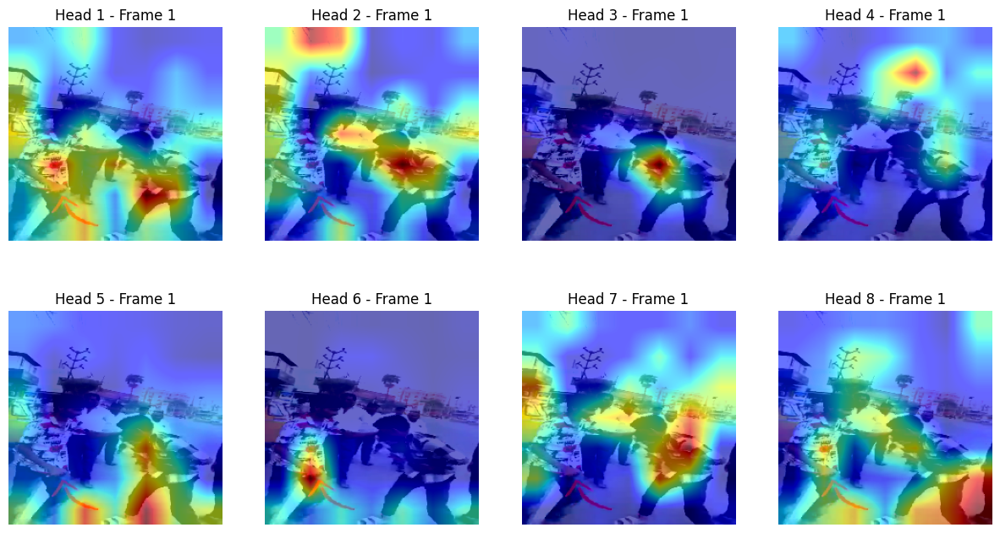

Processing frame 3


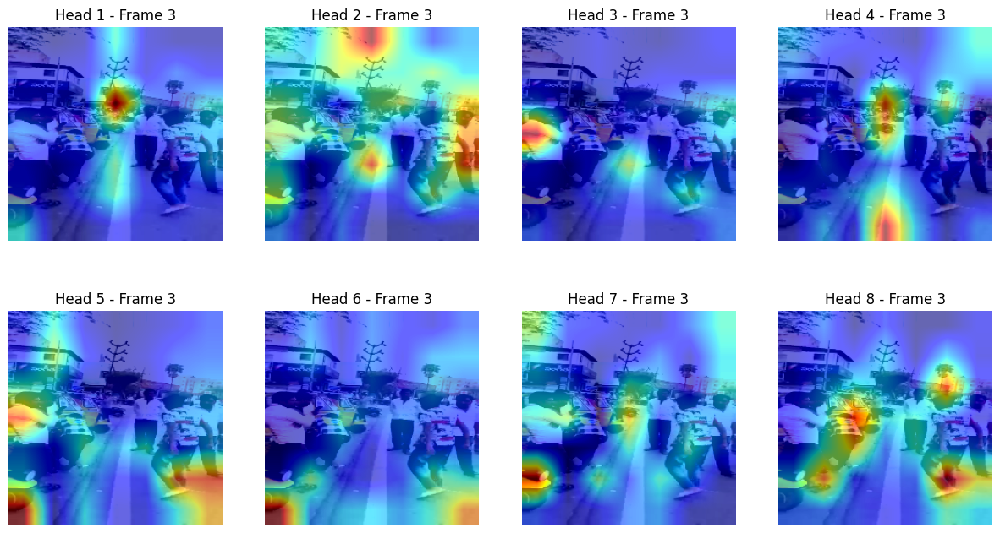

Processing frame 5


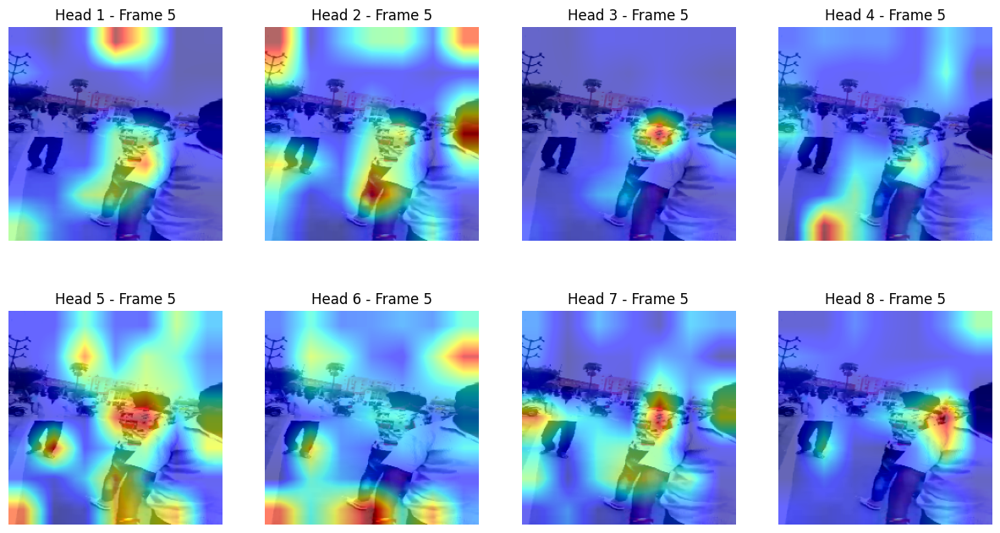

Processing frame 7


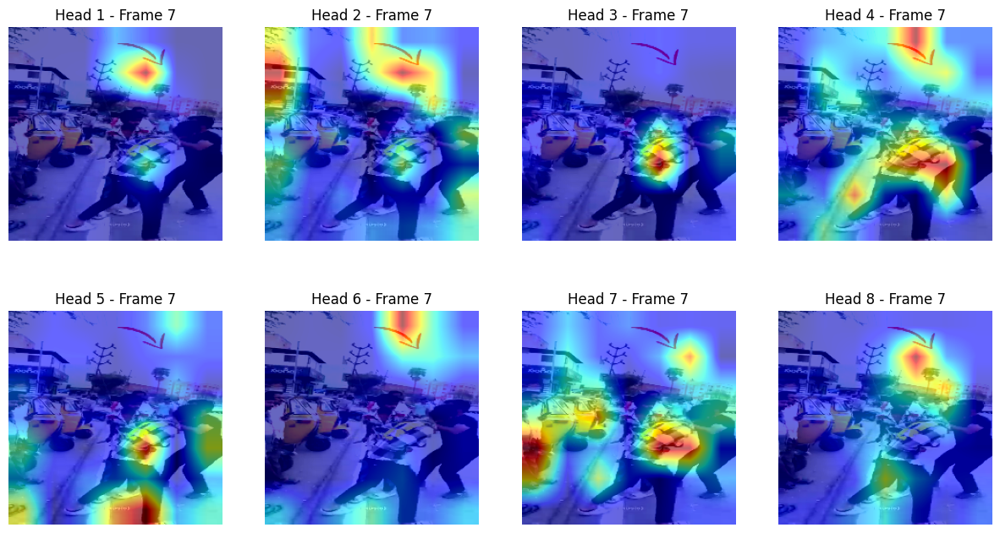

Processing frame 9


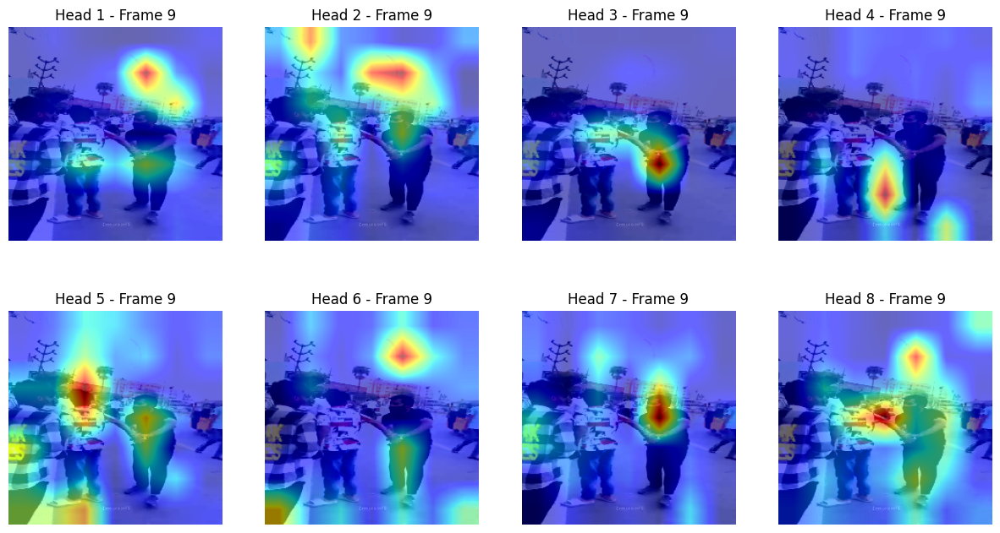

Processing frame 11


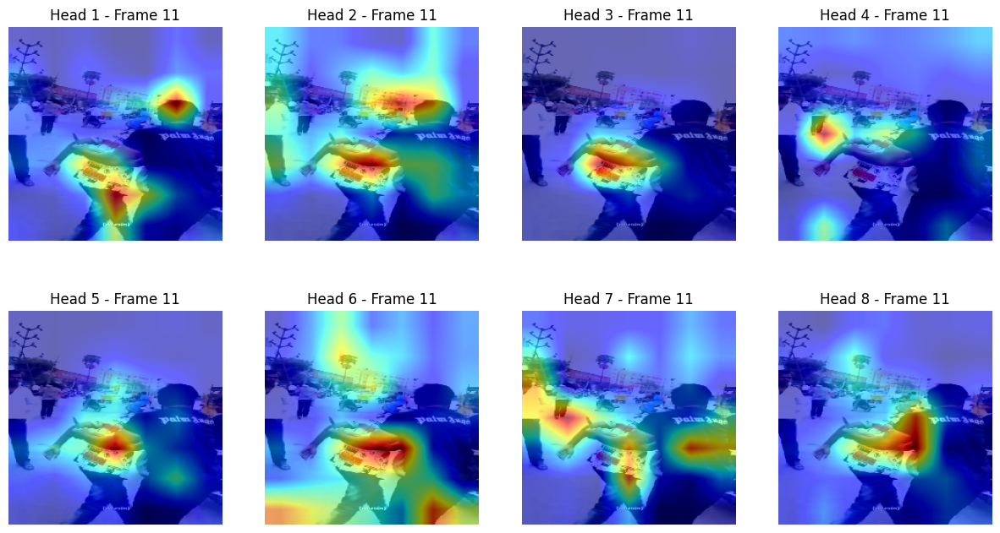

Processing frame 13


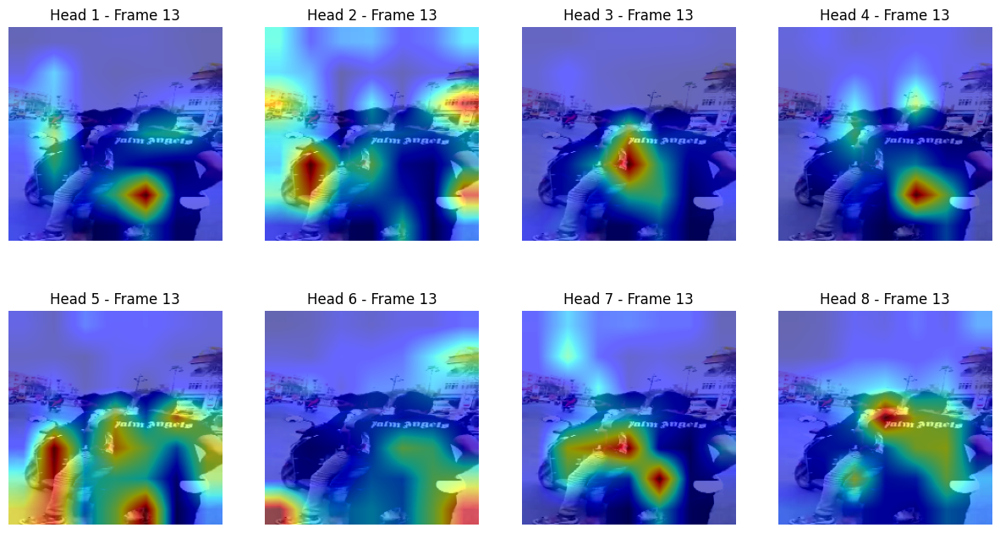

Processing frame 15


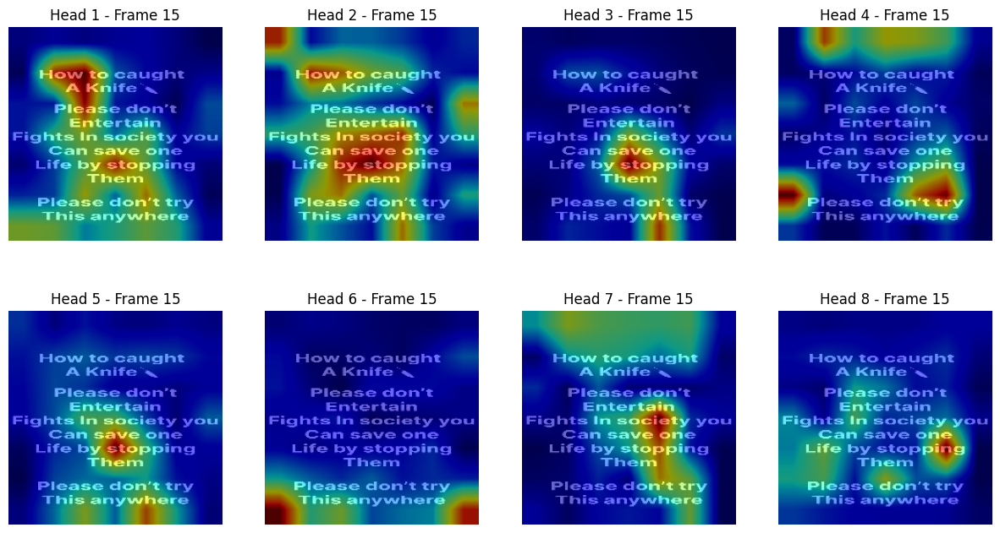

In [27]:
#-- Run ---------------------------------------------------------------------------------------------------------
video_path = '/kaggle/input/sample-videos-for-fight-detection-2/fight/fight (1).mp4'
# video_path = '/kaggle/input/sample-videos-for-fight-detection-2/normal/normal (1).mp4'
video_tensor = preprocess_video(video_path)
print('video_tensor:', video_tensor.shape)

predicted_lbl = predict_video(model , video_tensor)
print('predicted_lbl:', predicted_lbl)

#-- Get the attention map and cls_weight --
attn_map = model.model.blocks[-1].attn.attn_map.mean(dim=1).squeeze(0).detach()
cls_weight = model.model.blocks[-1].attn.cls_attn_map  

print('attn_map:' , attn_map.shape)
print('cls_weight:', cls_weight.shape)

patches_per_frame = cls_weight.shape[2] // NUM_ATTENDED_FRAMES  

framewise_attn = []
for i in range(NUM_ATTENDED_FRAMES):
    start = i * patches_per_frame
    end = (i + 1) * patches_per_frame
    frame_attn = cls_weight[0, :, start:end]  
    framewise_attn.append(frame_attn)


for frame_idx in FRAME_INDICES:
    
    frame_attn = framewise_attn[frame_idx // 2]  
    print(f"Processing frame {frame_idx}")    
    
    x = video_tensor[0, :, frame_idx, :, :]        
    x = torch.tensor(x).float()  

    
    cls_resized_all_heads = []
    for head in range(frame_attn.shape[0]):  
        cls_weight_head = frame_attn[head]  
        cls_weight_2d = cls_weight_head.view(1, 7, 7).unsqueeze(0)  

        cls_resized = F.interpolate(cls_weight_2d, size=(224, 224), mode='bilinear', align_corners=False)        
        # cls_resized = F.interpolate(cls_weight_2d, size=(224, 224), mode='bicubic', align_corners=False)
        # cls_resized = F.interpolate(cls_weight_2d, size=(224, 224), mode='nearest')
        cls_resized_all_heads.append(cls_resized)

    cls_resized_all_heads = torch.stack(cls_resized_all_heads)  
    cls_resized_normalized = cls_resized_all_heads / cls_resized_all_heads.max()  

    
    img_resized = x.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  
    # print('img_resized:', img_resized.shape)
    # print('x:', x.shape)
    
    plot_attention_maps(img_resized, cls_resized_normalized.squeeze(1), frame_idx)
#-----------------------------------------------------------------------------------------------------------------

video_tensor: torch.Size([1, 3, 16, 224, 224])
predicted_lbl: fight
attn_map: torch.Size([393, 393])
cls_weight: torch.Size([1, 8, 392])
Processing frame 1


/tmp/ipykernel_32/1791732209.py:35: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = torch.tensor(x).float()


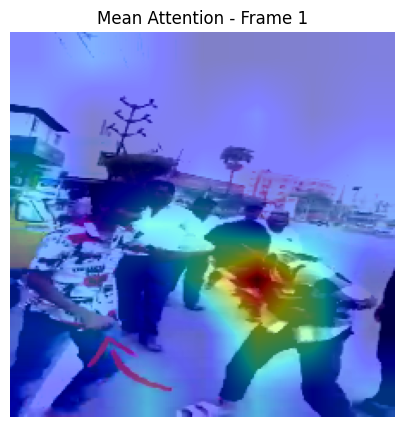

Processing frame 3


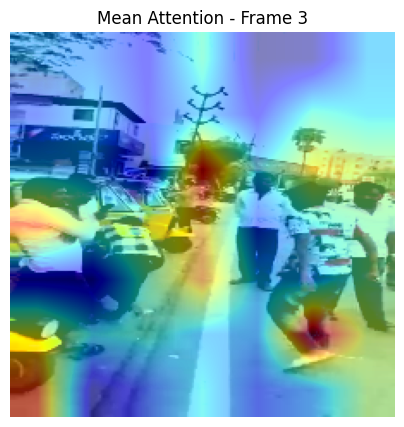

Processing frame 5


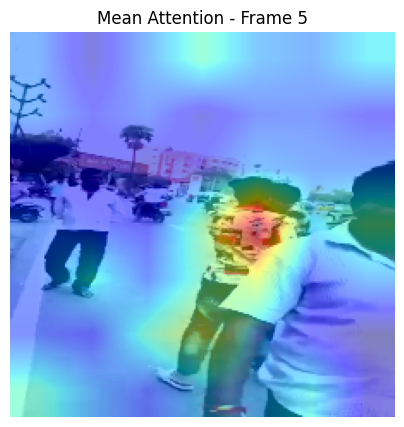

Processing frame 7


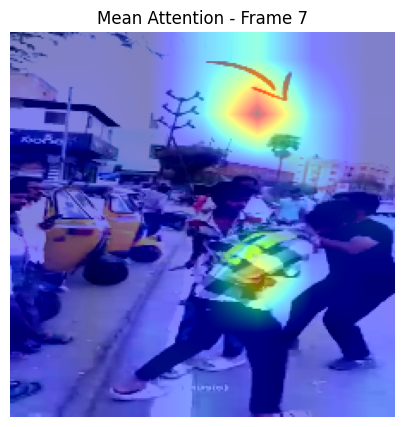

Processing frame 9


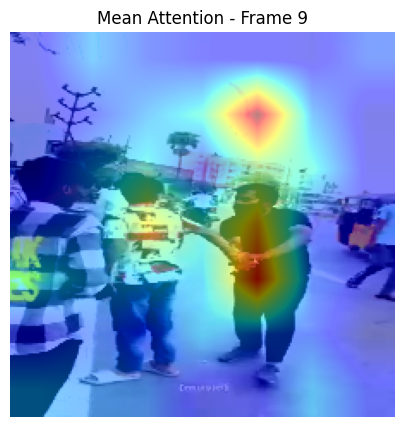

Processing frame 11


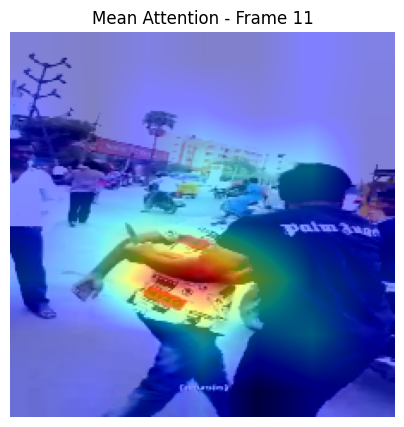

Processing frame 13


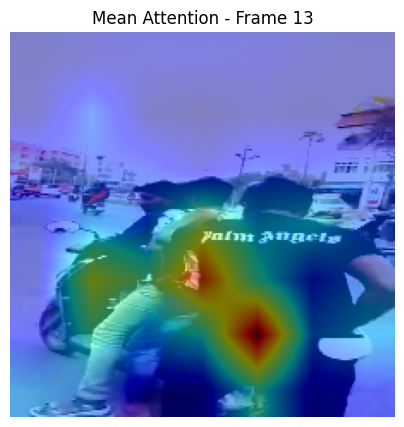

Processing frame 15


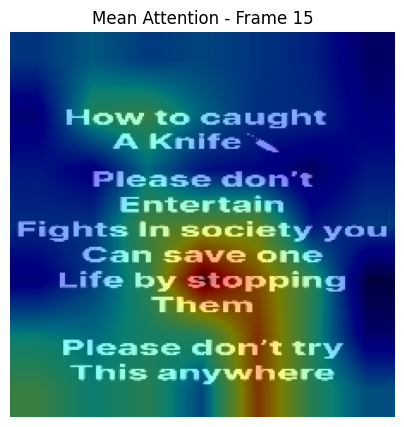

In [26]:
#-- Run (average of heads) ---------------------------------------------------------------------------------------------------------
video_path = '/kaggle/input/sample-videos-for-fight-detection-2/fight/fight (1).mp4'
# video_path = '/kaggle/input/sample-videos-for-fight-detection-2/normal/normal (1).mp4'


video_tensor = preprocess_video(video_path)
print('video_tensor:', video_tensor.shape)

predicted_lbl = predict_video(model , video_tensor)
print('predicted_lbl:', predicted_lbl)

#-- Get the attention map and cls_weight --
attn_map = model.model.blocks[-1].attn.attn_map.mean(dim=1).squeeze(0).detach()
cls_weight = model.model.blocks[-1].attn.cls_attn_map  

print('attn_map:' , attn_map.shape)
print('cls_weight:', cls_weight.shape)

patches_per_frame = cls_weight.shape[2] // NUM_ATTENDED_FRAMES  

framewise_attn = []
for i in range(NUM_ATTENDED_FRAMES):
    start = i * patches_per_frame
    end = (i + 1) * patches_per_frame
    frame_attn = cls_weight[0, :, start:end]  
    framewise_attn.append(frame_attn)


for frame_idx in FRAME_INDICES:
    
    frame_attn = framewise_attn[frame_idx // 2]  
    print(f"Processing frame {frame_idx}")    
    
    x = video_tensor[0, :, frame_idx, :, :]        
    x = torch.tensor(x).float()  

    cls_resized_all_heads = []
    for head in range(frame_attn.shape[0]):  
        cls_weight_head = frame_attn[head]  
        cls_weight_2d = cls_weight_head.view(1, 7, 7).unsqueeze(0)  

        cls_resized = F.interpolate(cls_weight_2d, size=(224, 224), mode='bilinear', align_corners=False)        
        cls_resized_all_heads.append(cls_resized)

    # تبدیل به tensor و گرفتن میانگین روی بعد Head
    cls_resized_all_heads = torch.stack(cls_resized_all_heads)  # [num_heads, 1, 224, 224]
    mean_attn_map = cls_resized_all_heads.mean(dim=0).squeeze(0)  # [224, 224]

    # نرمال‌سازی برای visualization
    mean_attn_map = mean_attn_map / mean_attn_map.max()

    # بازسازی تصویر فریم اصلی
    img_resized = x.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5  

    # رسم تنها یک هیت‌مپ (میانگین)
    plt.figure(figsize=(5, 5))
    plt.imshow(img_resized)
    plt.imshow(mean_attn_map.squeeze(0).cpu().numpy(), cmap='jet', alpha=0.5)
    plt.title(f"Mean Attention - Frame {frame_idx}")
    plt.axis('off')
    plt.show()
#-----------------------------------------------------------------------------------------------------------------

video_tensor: torch.Size([1, 3, 16, 224, 224])
predicted_lbl: fight
attn_map: torch.Size([393, 393])
cls_weight: torch.Size([1, 8, 392])
Processing frame 0


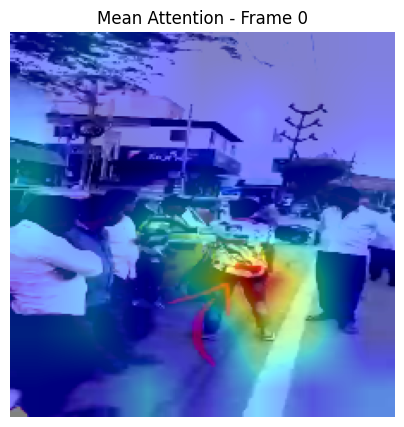

Processing frame 1


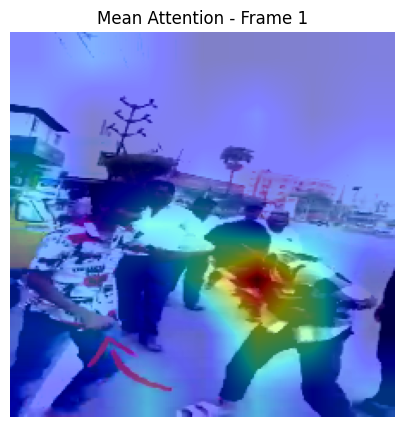

Processing frame 2


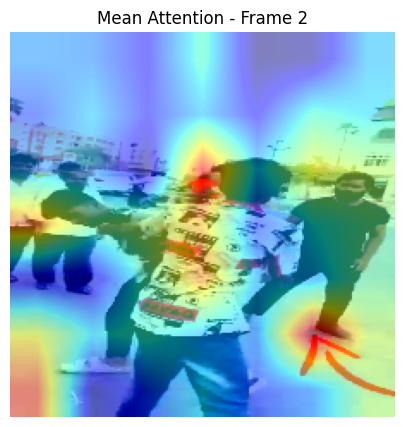

Processing frame 3


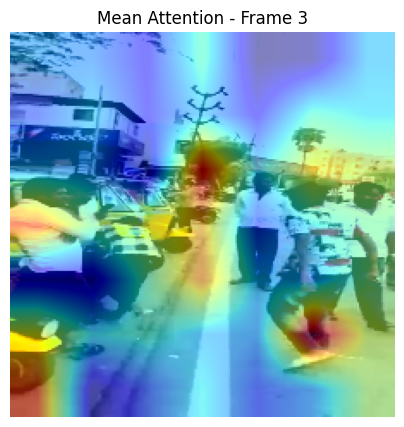

Processing frame 4


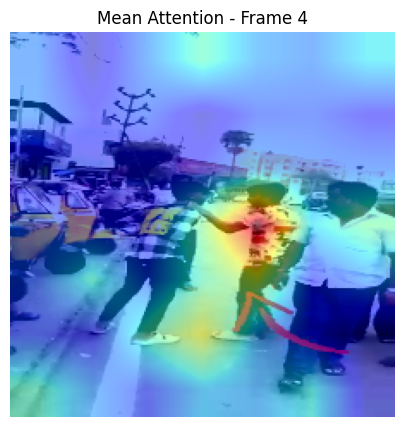

Processing frame 5


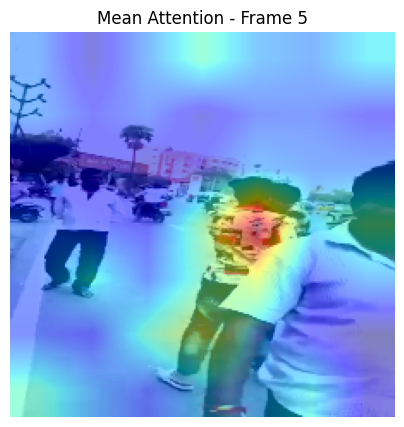

Processing frame 6


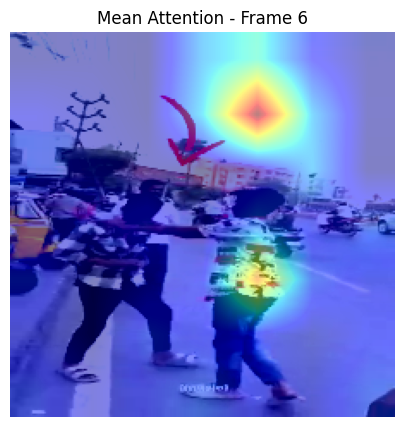

Processing frame 7


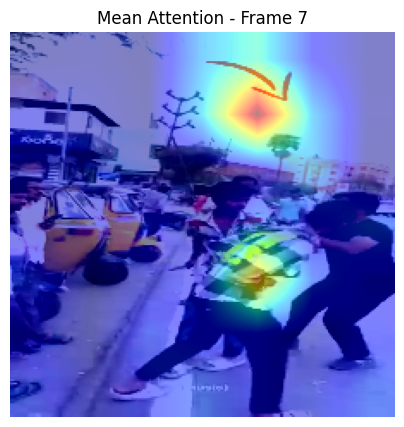

Processing frame 8


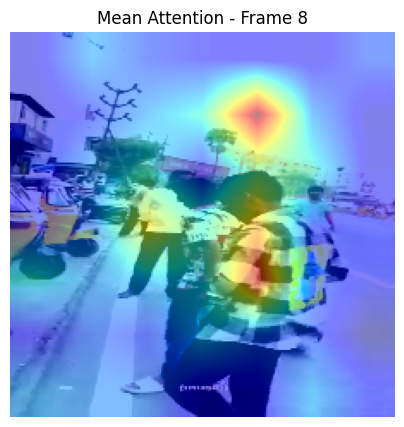

Processing frame 9


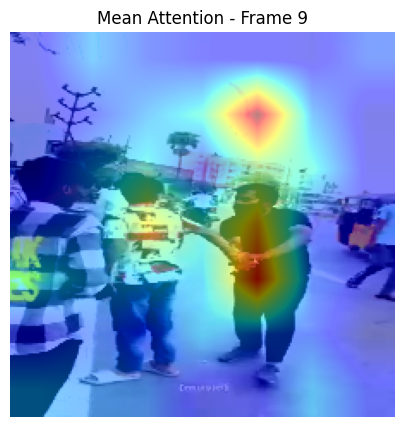

Processing frame 10


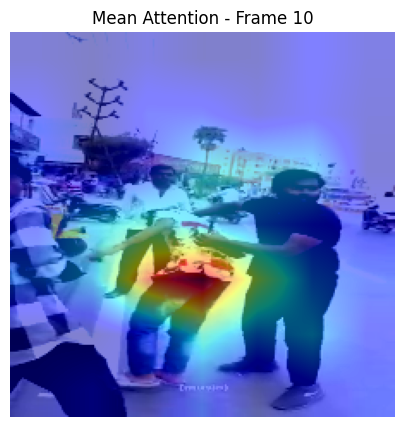

Processing frame 11


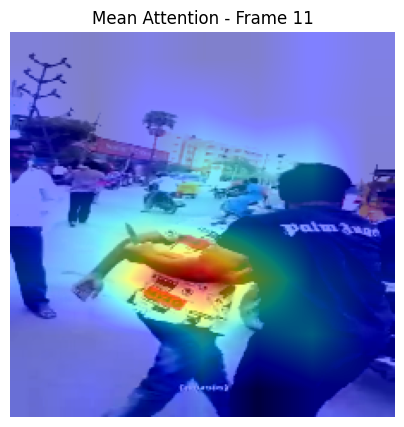

Processing frame 12


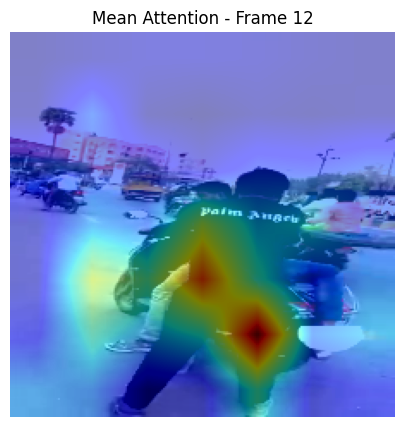

Processing frame 13


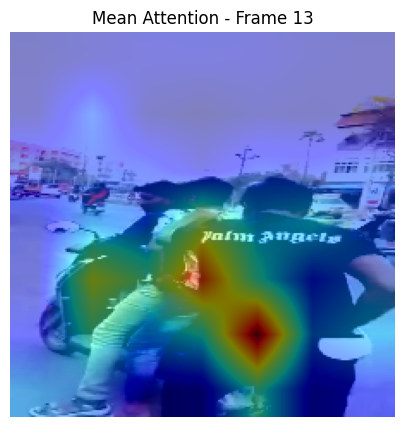

Processing frame 14


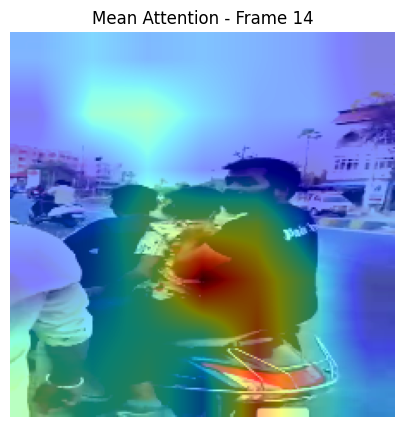

Processing frame 15


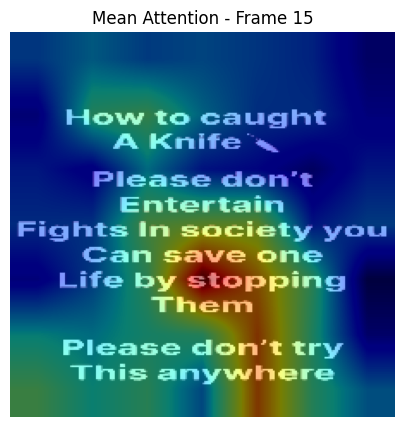

In [22]:
#-- Run (plot 16 frames) ---------------------------------------------------------------------------------------------------------
video_path = '/kaggle/input/sample-videos-for-fight-detection-2/fight/fight (1).mp4'
video_tensor = preprocess_video(video_path)
print('video_tensor:', video_tensor.shape)

predicted_lbl = predict_video(model , video_tensor)
print('predicted_lbl:', predicted_lbl)

#-- Get the attention map and cls_weight --
attn_map = model.model.blocks[-1].attn.attn_map.mean(dim=1).squeeze(0).detach()
cls_weight = model.model.blocks[-1].attn.cls_attn_map  

print('attn_map:' , attn_map.shape)
print('cls_weight:', cls_weight.shape)

patches_per_frame = cls_weight.shape[2] // NUM_ATTENDED_FRAMES  

framewise_attn = []
for i in range(NUM_ATTENDED_FRAMES):
    start = i * patches_per_frame
    end = (i + 1) * patches_per_frame
    frame_attn = cls_weight[0, :, start:end]  
    framewise_attn.append(frame_attn)


for i, frame_attn in enumerate(framewise_attn):
    for j in range(2):  # برای هر کدوم از دو فریم
        frame_idx = i * 2 + j  # فریم متناظر با attention i

        print(f"Processing frame {frame_idx}")
        
        x = video_tensor[0, :, frame_idx, :, :].clone().detach().float()

        cls_resized_all_heads = []
        for head in range(frame_attn.shape[0]):
            cls_weight_head = frame_attn[head]
            cls_weight_2d = cls_weight_head.view(1, 7, 7).unsqueeze(0)
            cls_resized = F.interpolate(cls_weight_2d, size=(224, 224), mode='bilinear', align_corners=False)
            cls_resized_all_heads.append(cls_resized)

        cls_resized_all_heads = torch.stack(cls_resized_all_heads)
        cls_resized_normalized = cls_resized_all_heads / cls_resized_all_heads.max()

        mean_attn_map = cls_resized_normalized.mean(dim=0)  # میانگین گرفتن از تمام هدها (dim=0 یعنی از headها)

        img_resized = x.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5

        plt.figure(figsize=(5, 5))
        plt.imshow(img_resized)
        plt.imshow(mean_attn_map.squeeze().cpu().numpy(), cmap='jet', alpha=0.5)
        plt.title(f"Mean Attention - Frame {frame_idx}")
        plt.axis('off')
        plt.show()

#-----------------------------------------------------------------------------------------------------------------